In [ ]:
!!pip install pandas
!!pip install matplotlib
!!pip install scipy

In [3]:
import pandas as pd;
import os;
import numpy as np

def read_file(path):
    df = pd.read_csv(path, sep='\\s+', header=None)[[2, 3]]
    df.columns = ['k', 'v']
    return df

def read_all(path, file_name):
    dfs = []
    for dir_name in os.listdir(path):
        dfs.append(read_file(os.path.join(path, dir_name, file_name)))
    return dfs

def calc_wave_num(len):
    k_min = 2 * np.pi / 21.2677242
    return np.arange(k_min, (len + 1) * k_min, k_min)

In [4]:
def dfs_2_plotable(dfs):
    return dfs[0].iloc[:, 0].values, calc_wave_num(len(dfs)), np.array([df.iloc[:, 1].values for df in dfs])

In [21]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio

# surf = go.Surface(z=z, x=x, y=y)
# fig = go.Figure(data=[surf])
# pio.show(fig)

def plot_surf(x, y, z, evel = 0, azim = 0):
    X, Y = np.meshgrid(x, y)

    fig = go.Figure(data=[go.Surface(z=z, x=X, y=Y)])
    fig.update_layout(width=1000, height=1000, scene=dict(
        xaxis_title='t [ps]',
        yaxis_title='k [Å^-1]'
    ))

    fig.show()
    # fig = plt.figure(figsize=(30, 30))
    # ax = fig.add_subplot(111, projection='3d')

    # ax.plot_surface(X, Y, z, rstride=20, cstride=20, edgecolor='k')
    # ax.set_zlim(-0.2, 0.5)
    # ax.view_init(evel, azim)


In [22]:
def read_n_plot(file_name):
    dfs = read_all('./data', file_name)
    x, y, z = dfs_2_plotable(dfs)
    plot_surf(x, y, z) 
    # r = [
    #     df.iloc[-1]['v'] for df in dfs
    # ]
    # plt.plot(r)
    return dfs

dfs = read_n_plot('ektd.0')

In [47]:
def plot_ft(df):
    dt = df['k'][1] - df['k'][0]
    freq = np.fft.fftfreq(2000, d=dt)

    F = np.fft.fft(df['v'])

    plt.figure(figsize=(10, 10))
    plt.plot(freq, np.abs(F))
    plt.xlim(-40, 40)
    
def plot_ft_surf(file_name):
    dfs = read_all('./data', file_name)

    x, y, z = dfs_2_plotable(dfs)
    z_ft = np.fft.fft(z)
    z_ft_cut = np.where(np.abs(z_ft) > 100, 0, z_ft)
    dt = dfs[0]['k'][1] - dfs[0]['k'][0]
    x = np.fft.fftfreq(2000, d=dt)

    X, Y = np.meshgrid(x, y)

    fig = go.Figure(data=[go.Surface(z=np.abs(z_ft_cut), x=X, y=Y)])
    fig.update_layout(
        width=1000, 
        height=1000, 
        scene=dict(
            xaxis_title='ω [Hz]',
            yaxis_title='k [Å^-1]',
            # zaxis=dict(title='Quadro', range=[-5, 100])
        ),
    )

    fig.show()
    
    return dfs

dfs = plot_ft_surf('ektd.0')

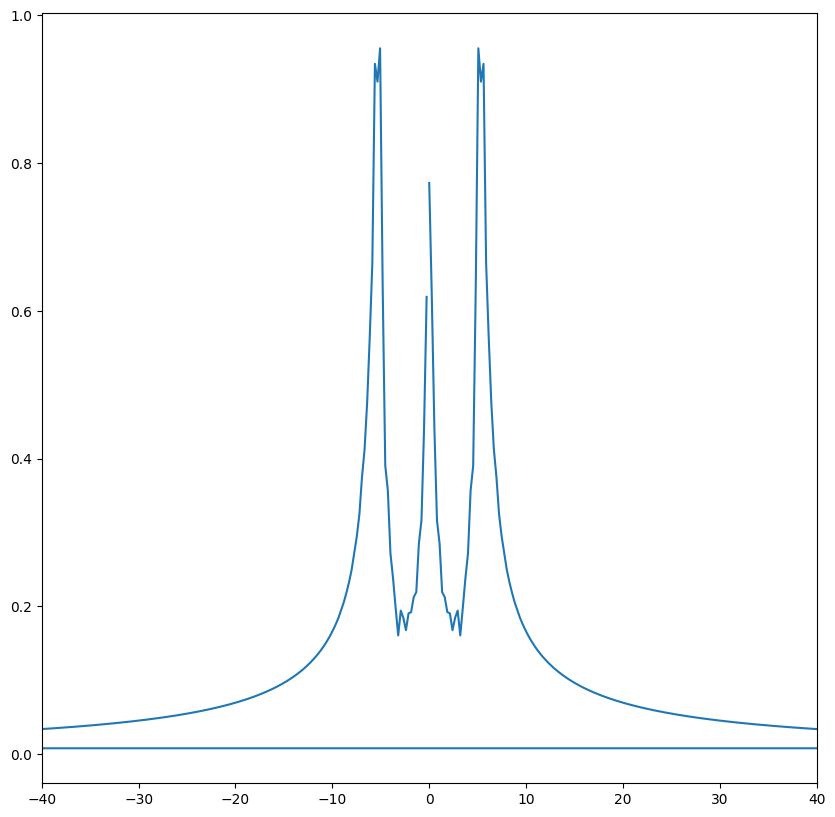

In [100]:
plot_ft(dfs[50])